# Aggregated plots for series of size 40

## 1. File with information about ICO

In [1]:
import pandas as pd
import os
import re
import pytz
from datetime import datetime, timedelta
import plotly.graph_objects as go
import pickle
pd.options.plotting.backend = "plotly"

In [2]:
df_info = pd.read_csv('lista_ico_2020-08-17_tab3.csv', sep=',')

In [3]:
df_info.head()

,ico,adress,fraud,start_date,market_start_date,diff_days,market_days,size_ok,price,market_cap,o_concur,biggest_holder,exchange,contract,date_analysis,code,site,social_media
0,0X,0xe41d2489571d322189246dafa5ebde1f4699f498,0,2017-08-11,2017-08-15,4,1124,NaN,NaN,45.0,x,2,6,14,2018-02-11,NaN,NaN,NaN
1,0XCERT,0x83e2be8d114f9661221384b3a50d24b96a5653f5,1,2018-06-26,2018-07-11,15,794,x,NaN,NaN,NaN,12,2,0,2019-01-07,x,x,x
2,4NEW,0x241ba672574a78a3a604cdd0a94429a73a84a324,1,2018-08-20,2018-08-20,0,754,x,NaN,NaN,NaN,50,7,0,2019-02-16,x,NaN,NaN
3,ABULABA,0xd938137e6d96c72e4a6085412ada2dad78ff89c4,1,2018-04-19,2018-12-16,241,636,NaN,x,NaN,NaN,13,7,41,2019-06-14,x,NaN,NaN
4,AELF,0xbf2179859fc6d5bee9bf9158632dc51678a4100e,0,2017-12-18,2017-12-21,3,996,NaN,NaN,154.0,x,13,10,0,2018-06-19,NaN,NaN,NaN


## 2. Load data from .py file
For each key inside the dictionary, the arrays correspond to the following series:

0. array_daily_transactions
1. array_perc_new_holders
2. array_biggest_holder
3. array_newbiers
4. array_gas_ratio
5. array_daily_transactions_ma
6. array_perc_new_holders_ma
7. array_biggest_holder_ma
8. array_newbiers_ma
9. array_gas_ratio_ma


In [4]:
with open('dict_arrays_length40.pickle','rb') as pickle_file:
    dict_ico_len_40 = pickle.load(pickle_file) 

In [5]:
dict_ico_len_40.get('arrays')

('array_daily_transactions',
 'array_perc_new_holders',
 'array_biggest_holder',
 'array_newbiers',
 'array_gas_ratio',
 'array_daily_transactions_ma',
 'array_perc_new_holders_ma',
 'array_biggest_holder_ma',
 'array_newbiers_ma',
 'array_gas_ratio_ma')

In [6]:
dict_ico_len_40.pop('arrays')

('array_daily_transactions',
 'array_perc_new_holders',
 'array_biggest_holder',
 'array_newbiers',
 'array_gas_ratio',
 'array_daily_transactions_ma',
 'array_perc_new_holders_ma',
 'array_biggest_holder_ma',
 'array_newbiers_ma',
 'array_gas_ratio_ma')

## 4. Filter data for size equals to 20

In [7]:
dict_perc_transactions = {k:v[0] for k,v in dict_ico_len_40.items() if len(v[0]) == 40}
dict_perc_new_holders = {k:v[1] for k,v in dict_ico_len_40.items() if len(v[1]) == 40}
dict_perc_big_holder = {k:v[2] for k,v in dict_ico_len_40.items() if len(v[2]) == 40}
dict_perc_newbiers = {k:v[3] for k,v in dict_ico_len_40.items() if len(v[3]) == 40}
dict_gas_ratio = {k:v[4] for k,v in dict_ico_len_40.items() if len(v[4]) == 40}
dict_perc_transactions_ma = {k:v[5] for k,v in dict_ico_len_40.items() if len(v[5]) == 40}
dict_perc_new_holders_ma = {k:v[6] for k,v in dict_ico_len_40.items() if len(v[6]) == 40}
dict_perc_big_holder_ma = {k:v[7] for k,v in dict_ico_len_40.items() if len(v[7]) == 40}
dict_perc_newbiers_ma = {k:v[8] for k,v in dict_ico_len_40.items() if len(v[8]) == 40}
dict_gas_ratio_ma = {k:v[9] for k,v in dict_ico_len_40.items() if len(v[9]) == 40}

In [8]:
df_transactions = pd.DataFrame(dict_perc_transactions).T
df_new_holders = pd.DataFrame(dict_perc_new_holders).T
df_big_holder = pd.DataFrame(dict_perc_big_holder).T
df_newbiers = pd.DataFrame(dict_perc_newbiers).T
df_gasratio = pd.DataFrame(dict_gas_ratio).T
df_transactions_ma = pd.DataFrame(dict_perc_transactions_ma).T
df_new_holders_ma = pd.DataFrame(dict_perc_new_holders_ma).T
df_big_holder_ma = pd.DataFrame(dict_perc_big_holder_ma).T
df_newbiers_ma = pd.DataFrame(dict_perc_newbiers_ma).T
df_gasratio_ma = pd.DataFrame(dict_gas_ratio_ma).T

In [9]:
print(df_transactions.shape)
print(df_new_holders.shape)
print(df_big_holder.shape)
print(df_newbiers.shape)
print(df_gasratio.shape)
print(df_transactions_ma.shape)
print(df_new_holders_ma.shape)
print(df_big_holder_ma.shape)
print(df_newbiers.shape)
print(df_gasratio_ma.shape)

(237, 40)
(237, 40)
(237, 40)
(237, 40)
(223, 40)
(237, 40)
(237, 40)
(237, 40)
(237, 40)
(223, 40)


## 5. Plotting the dataset

In [10]:
import plotly.express as px

def plot_series(df_series, df_ico_info, title):
    df_labeled = df_series.merge(df_ico_info[['ico', 'fraud']], left_index=True, right_on='ico')
    df_labeled.set_index('ico', inplace=True)
    df_series.loc['fraud_mean'] = df_labeled[df_labeled.fraud == 1].iloc[:, :].mean(axis=0)
    df_series.loc['success_mean'] = df_labeled[df_labeled.fraud == 0].iloc[:, :].mean(axis=0)
    df_series_t = df_series.T
    df_series_t.head()
    df_series_t.index = df_series_t.index + 1

    fraud_dict = {1: 'fraud', 0:'success'}
    color_dict = {1: 'rgba(152, 0, 0, .1)', 0: 'rgba(0,0,255,.1)'}

    fig = go.Figure()
    for ico in df_series_t.columns[:-2]:
        is_fraud = df_ico_info.loc[df_ico_info.ico ==ico]['fraud'].values[0]
        fig.add_trace(go.Scatter(x=df_series_t.index.values, y=df_series_t[ico], #opacity=0.2,
                                showlegend=False,
                                legendgroup = fraud_dict.get(is_fraud),
                                marker_color=color_dict.get(is_fraud)))
    fig.add_trace(go.Scatter(x=df_series_t.index.values, y=df_series_t['fraud_mean'], #opacity=0.2,
                                name='fraud_mean',
                                legendgroup ='fraud',
                                marker_color='rgba(152, 0, 0, 1.)',
                             showlegend=True             
                 ))

    fig.add_trace(go.Scatter(x=df_series_t.index.values, y=df_series_t['success_mean'], #opacity=0.2,
                                name='success_mean',
                                legendgroup ='success',
                                marker_color='rgba(0,0,255,1.0)',
                             showlegend=True             
                 ))
    fig.update_layout(title=title)

    fig.show()
    

### Transactions

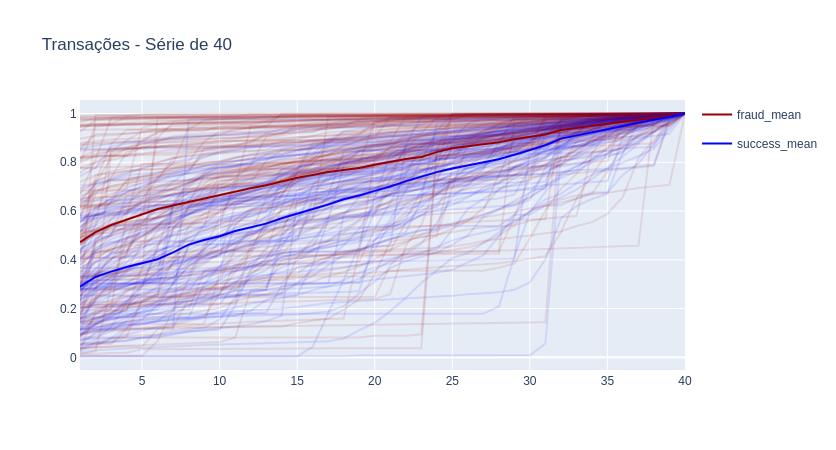

In [11]:
plot_series(df_transactions, df_info, 'Transações - Série de 40')

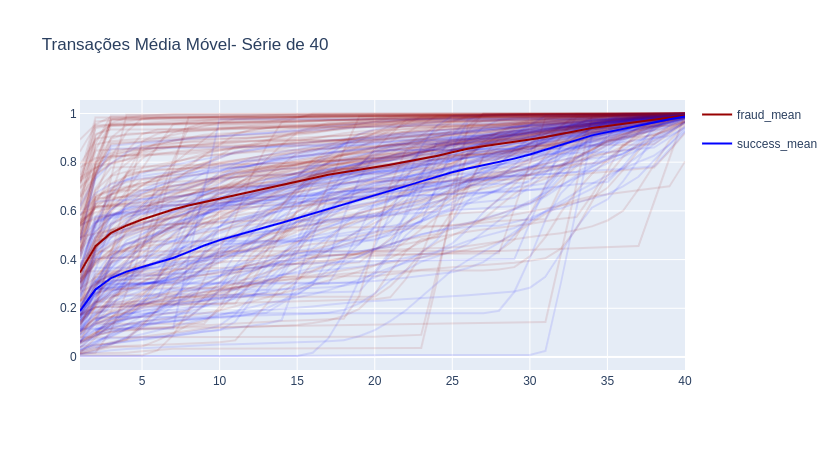

In [12]:
plot_series(df_transactions_ma, df_info, 'Transações Média Móvel- Série de 40')

### New holders

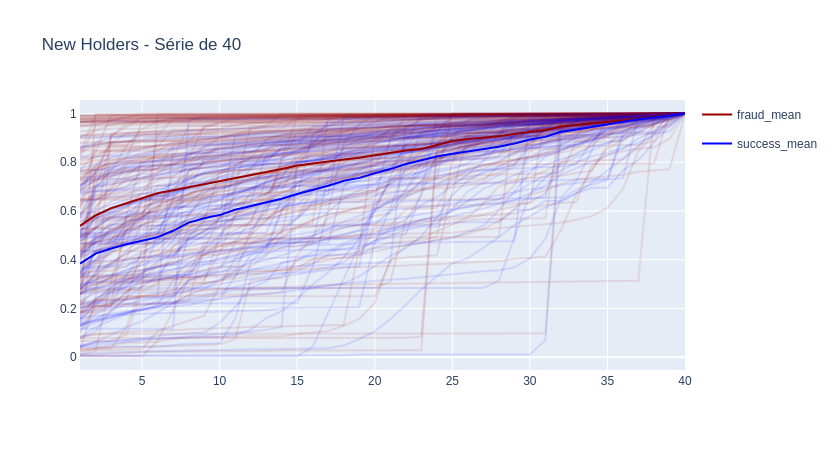

In [13]:
plot_series(df_new_holders, df_info, 'New Holders - Série de 40')

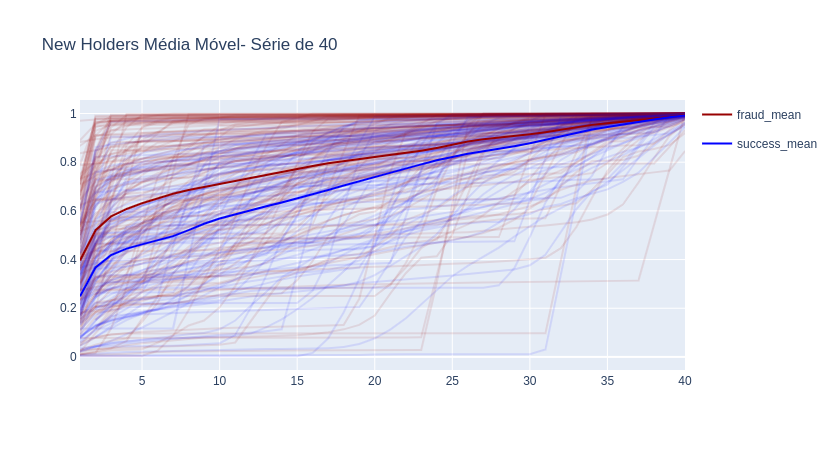

In [14]:
plot_series(df_new_holders_ma, df_info, 'New Holders Média Móvel- Série de 40')

### Biggest Holder

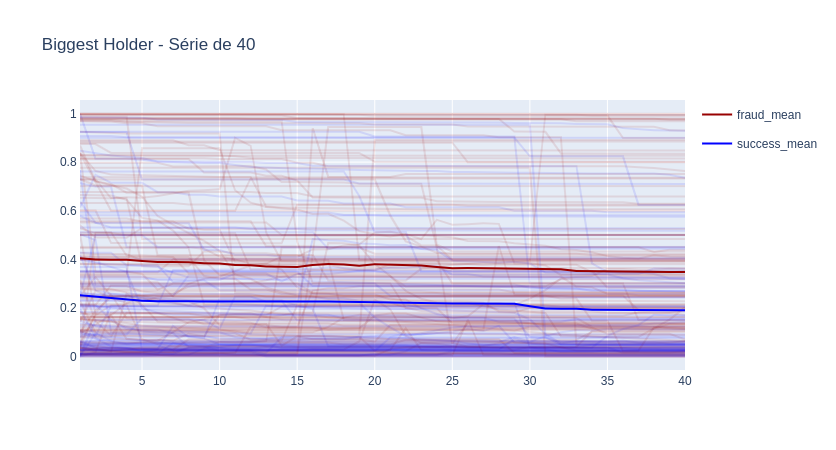

In [15]:
plot_series(df_big_holder, df_info, 'Biggest Holder - Série de 40')

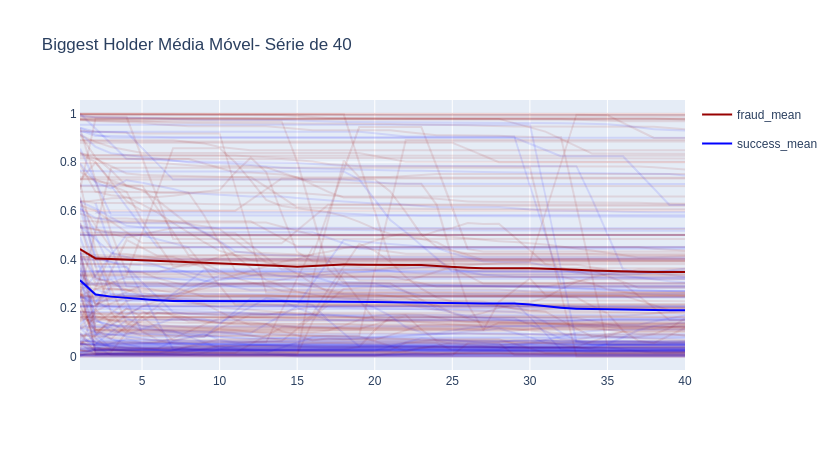

In [16]:
plot_series(df_big_holder_ma, df_info, 'Biggest Holder Média Móvel- Série de 40')

### New biers

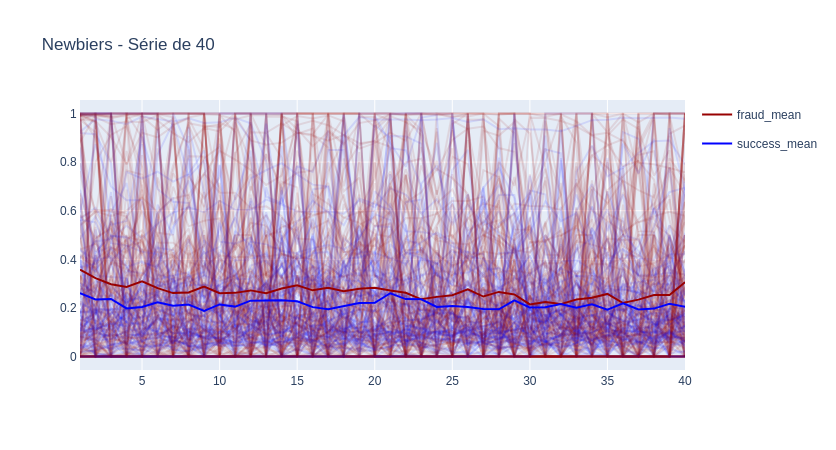

In [17]:
plot_series(df_newbiers, df_info, 'Newbiers - Série de 40')

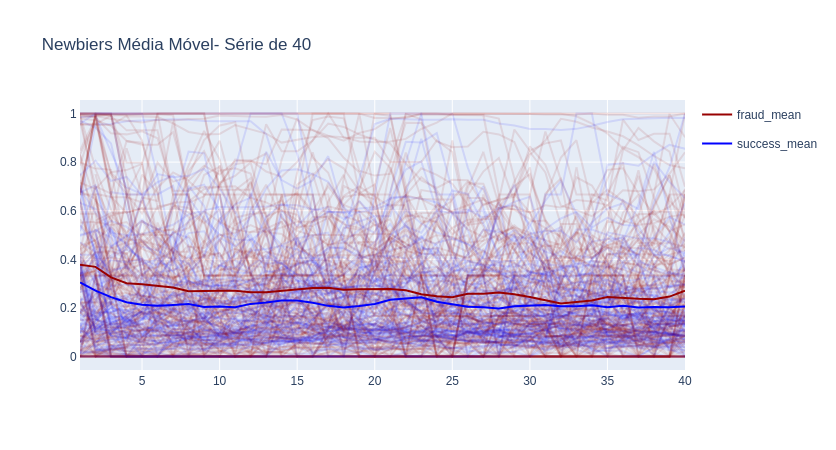

In [18]:
plot_series(df_newbiers_ma, df_info, 'Newbiers Média Móvel- Série de 40')

### Gas Ratio

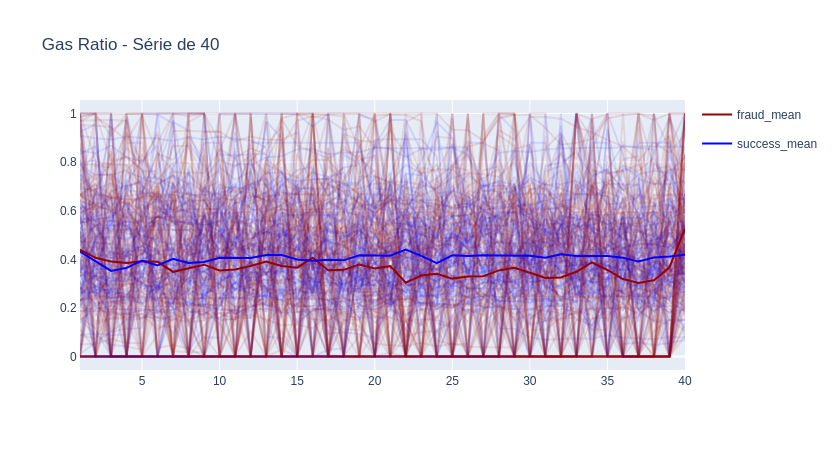

In [19]:
plot_series(df_gasratio, df_info, 'Gas Ratio - Série de 40')

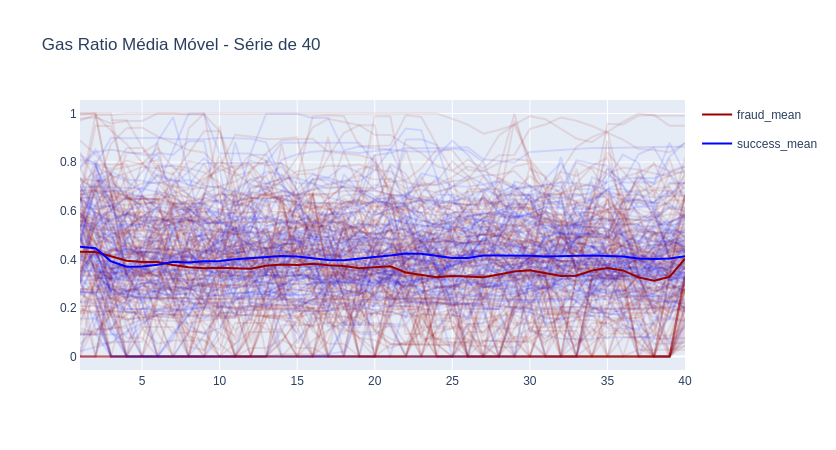

In [20]:
plot_series(df_gasratio_ma, df_info, 'Gas Ratio Média Móvel - Série de 40')